# Prendre en main l'API Python d'ArcGIS - épisode 6
## Clonage, édition et mise à jour des données (cartes, couches)

Dans ce sixième tutoriel de le **[série de l'été consacrée à la prise en main de l'API Python d'ArcGIS](https://www.codethemap.fr/2024/05/prise-en-main-api-python-arcgis-intro.html)**, nous allons voir ensemble comment automatiser le clonage et la mise à jour de ses données, que ce soit des couches ou des cartes.   
[Dans le tutoriel précédent](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-preparation-donnees-sedf.html), nous avons appris à télécharger, préparer et publier des éléments sur son portail de manière automatique. Grâce à ce nouveau tutoriel, vous pourrez insérer ce que vous avez appris dans des workflows de mise à jour. Nous allons ainsi réaccéder au feature layer publié la semaine dernière pour l'actualiser avec des données plus récentes, sans l'écraser ni le republier. Toutes les cartes et applications dans lesquelles ce feature layer est utilisé se verront ainsi également actualisée avec les nouvelles données. 

Notez qu'un compte Creator ou supérieur avec des privilèges de publication de contenu sont nécessaires.
Vous pouvez exécuter ce Notebook directement dans ArcGIS Notebooks sur ArcGIS Online (disponible par défaut si votre administrateur vous a accordé les droits nécessaires), dans ArcGIS Enterprise (disponible avec le rôle serveur correspondant) ou en le téléchargeant et en l'ouvrant sur ArcGIS Pro (plus d'infos [dans la doc](https://pro.arcgis.com/fr/pro-app/latest/arcpy/get-started/pro-notebooks.htm)). Vous pouvez également l'exécuter dans n'importe quel environnement d'exécution de votre choix, mais veillez dans ce cas à [avoir installé les packages nécessaires](https://developers.arcgis.com/python/guide/anaconda/).


### 1/ Import des bibliothèques et connexion au GIS

Nous commençons par importer les différentes bibliothèques nécessaires, puis par nous connecter au SIG. 
Pour cela, nous importons l'objet [`GIS` du module `gis`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#gis), qui représente notre organisation. 
La connexion est ensuite à adapter selon votre environnement et votre méthode d'authentification. [Voir l'aide en ligne pour plus d'informations](https://developers.arcgis.com/python/guide/working-with-different-authentication-schemes/).  
Si vous êtes connectés en tant qu'admin, la cellule va vous renvoyer un message rouge pour vous prévenir qu'il faut faire attention aux opérations que vous utilisez. Cela n'empêche pas votre code de s'exécuter correctement.

In [1]:
import pandas as pd

from arcgis.gis import GIS
gis = GIS("home")

/opt/conda/lib/python3.11/site-packages/arcgis/gis/__init__.py:731: UserWarning: You are logged on as plouis_esrifrance with an administrator role, proceed with caution.
  warnings.warn(


#### Alternative pour la connexion si votre environnement n'est pas directement connecté à votre portail

Si votre environnement n'est pas directement connecté à votre SIG, vous devrez lui passer vos informations d'authentification via la cellule suivante, que vous devez bien sûr mettre à jour avec vos propres informations :

In [ ]:
#à mettre à jour avec vos données d'authentification
from arcgis.gis import GIS

gis =GIS(
url="https://url.devotre.org/portal",
username="nom_utilisateur",
password="motdepasse"
)

### 2/ Elements basiques de clonage et de mise à jour d'une carte

Nous allons commencer par des éléments très basique de clonage et de mise à jour en travaillant avec une webmap.

#### Accès à une webmap

Je commence par accéder à une webmap de mon portail avec la méthode [`get()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.get) du [`ContentManager`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#contentmanager) de l'API. De votre côté, vous pouvez faire pareil en accédant à n'importe quelle webmap qui vous appartient sur votre portail, en remplaçant l'id que j'ai utilisé par l'id de votre propre item.

<Item title:"Grands Prix de Formule 1 - Calendrier 2024" type:Web Map owner:plouis_esrifrance>
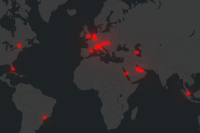

In [28]:
carte_item = gis.content.get("3ecc498e68cd4022a882363424794422") #remplacez par l'id d'une de vos webmaps
carte_item

#### Clonage de la webmap

Nous pourrions effectuer directement les modifications sur notre webmap, mais nous allons plutôt commencer par la cloner pour éviter de créer tout problème dans notre contenu orginel. Pour cela, le [`ContentManager`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#contentmanager) possède une méthode [`clone_items()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.clone_items) à l'intérieur de laquelle nous transmettons la liste des items à cloner. 

In [30]:
clone = gis.content.clone_items(items = [carte_item])
clone

[<Item title:"2024 F1 GP Circuits_WFL1" type:Feature Layer Collection owner:plouis_esrifrance>,
 <Item title:"Grands Prix de Formule 1 - Calendrier 2024" type:Web Map owner:plouis_esrifrance>]

En transmettant l'item de la webmap, nous clonons non seulement la webmap mais aussi tous les feature layers qu'elle contient. Vous voyez que le clone retourne une liste contenant pour ma part ma webmap et son feature layer.  

La méthode [`clone_items()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.clone_items) supporte un grand nombre d'items pour le clonage, non seulement des cartes et des couches, mais aussi des formulaires Survey123, des applications (StoryMap, Dashboards...), des Notebooks, etc. Vous trouverez la liste complète des items supportés [dans la documentation](https://developers.arcgis.com/python/guide/cloning-content/#supported-items).  
Dans ce tutoriel, nous ne verrons qu'un clonage basique d'un item au sein d'un seul portail dans le contenu d'un seul utilisateur. Sachez que [`clone_items()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.clone_items) peut également être utilisée pour cloner des contenus d'un utilisateur à un autre, voire même d'un portail à un autre. C'est une méthode très pratique pour transférer du contenu vers une autre organisation !  

Cela dit, passons à la suite du tutoriel. Dans la liste renvoyée par le clone, je vais accéder à la webmap, qui est pour ma part en deuxième position (donc à l'index 1) :

<Item title:"Grands Prix de Formule 1 - Calendrier 2024" type:Web Map owner:plouis_esrifrance>
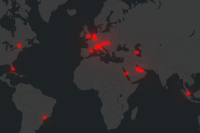

In [31]:
clone_carte_item = clone[1]
clone_carte_item

#### Mise à jour de la webmap

Dans le [tutoriel numéro 4 de la série](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-creation-publication-partage-carte.html), nous avons appris à créer une webmap dans l'API Python en construisant la carte de zéro. Sachez qu'il est également possible d'accéder et d'afficher une webmap déjà créée et présente dans le protail. Nous utilisons pour cela, nous utilisons la classe [`WebMap`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#webmap) du module `mapping` de l'API, et nous passons notre item de webmap en argument (j'utilise ici la webmap clonée).  
Cela va créer une [`MapView`](https://developers.arcgis.com/python/api-reference/arcgis.widgets.html#arcgis.widgets.MapView) qui va afficher votre carte directement dans le Notebook si votre environnement de développement le supporte.

In [32]:
from arcgis.mapping import WebMap
webmap = WebMap(clone_carte_item)
webmap

MapView(hide_mode_switch=True, layout=Layout(height='400px', width='100%'))

Cela va créer une [`MapView`](https://developers.arcgis.com/python/api-reference/arcgis.widgets.html#arcgis.widgets.MapView) qui va afficher votre carte directement dans le Notebook si votre environnement de développement le supporte. Voici ce à quoi cela ressemble pour ma part :  
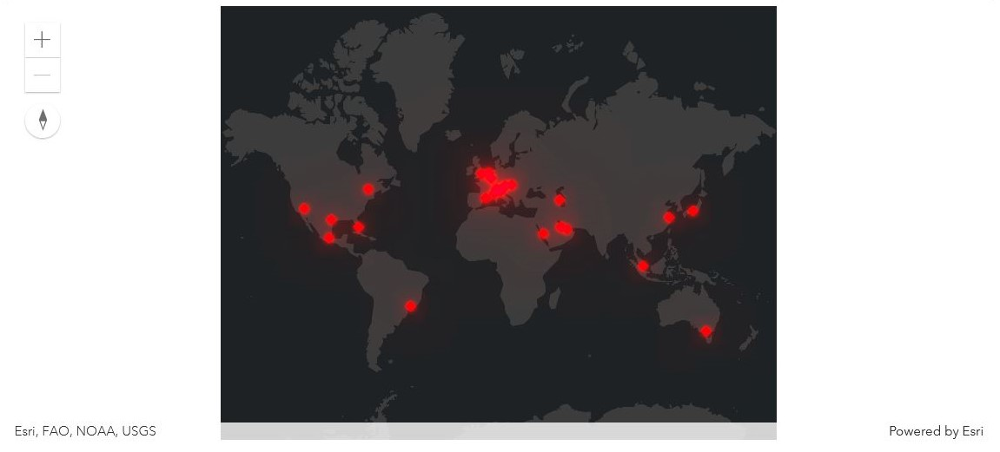

Je peux ensuite accéder à tous les paramètres de la [`MapView`](https://developers.arcgis.com/python/api-reference/arcgis.widgets.html#arcgis.widgets.MapView) comme dans le [tuto 4](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-creation-publication-partage-carte.html) afin de les mettre à jour.  
Je vais par exemple modifier la basemap utilisée :

In [33]:
webmap.basemap = 'arcgis-nova'

Si vous retournez plus haut, vous devriez voir votre widget [`MapView`] se mettre à jour avec le nouveau fond de carte :  
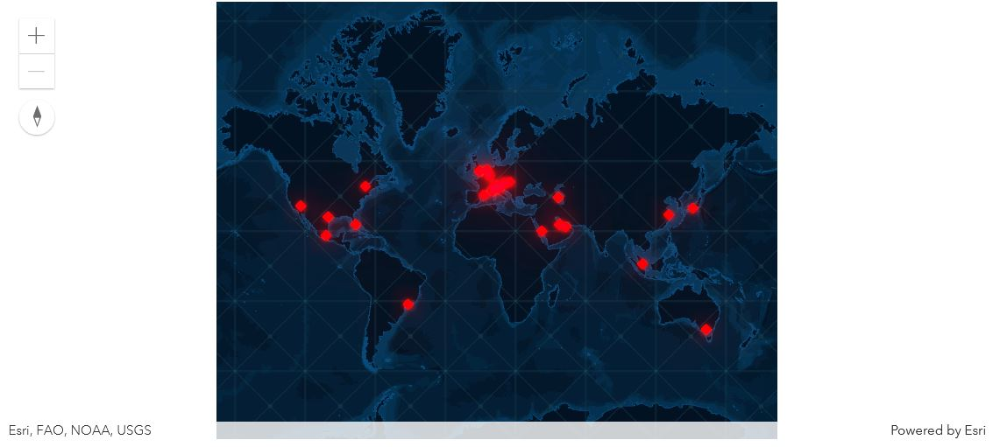

Pour information, vous pouvez accéder à la liste des basemaps disponibles en décommentant et en exécutant la cellule ci-dessous :

In [ ]:
#webmap.basemaps

Pour l'instant, la modification n'est effective que dans mon instance de [`MapView`](https://developers.arcgis.com/python/api-reference/arcgis.widgets.html#arcgis.widgets.MapView), mais ne se répercute pas encore dans ma webmap. Nous allons devoir utiliser la méthode [`update()`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#arcgis.mapping.WebMap.update). Celle-ci est similaire à la méthode [`save()`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#arcgis.mapping.WebMap.save) que nous avons utilisée dans le tutoriel 4, mais est utilisée sur une webmap existante pour la mettre à jour plutôt que pour la publication d'une nouvelle webmap.  
Vous avez peut-être noté que dans votre portail, la webmap clonée possède exactement le même titre que la webmap d'origine. Je profite de la mise à jour de la webmap pour passer un nouveau titre en argument via la propriété `item_properties` de l'[`update()`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#arcgis.mapping.WebMap.update), dans laquelle j'attribue une nouvelle valeur à la clé `title` (ici, je rajoute sobrement "MAJ -" devant le titre de la webmap).

In [34]:
webmap.update(item_properties={'title':'MAJ - Grands Prix de Formule 1 - Calendrier 2024'})

True

Vous pouvez aller voir que les modifications ont bien été prises en compte, soit directement en réappelant l'item et en allant le consulter, soit en réaffichant la webmap dans une nouvelle MapView :

<Item title:"MAJ - Grands Prix de Formule 1 - Calendrier 2024" type:Web Map owner:plouis_esrifrance>
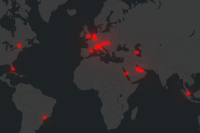

In [35]:
clone_carte_item

In [36]:
webmap2 = WebMap(clone_carte_item)
webmap2

MapView(hide_mode_switch=True, layout=Layout(height='400px', width='100%'))

### 3/ Mise à jour automatique d'une couche

Dans le [tutoriel 5](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-preparation-donnees-sedf.html), nous avons appris à télécharger, à préparer et à publier automatiquement des données dans notre portail. Nous avons utilisé les [données d'historique journalier du compteur de trafic routier de Bordeaux Métropole](https://www.data.gouv.fr/en/datasets/compteur-de-trafic-historique-journalier/#/resources). Ces données étant mises à jour quotidiennement, il serait intéressant de pouvoir de notre côté également mettre à jour le feature layer publié pour l'actualiser avec les dernières données en date.  
En mettant à jour le feature layer, toutes les cartes et applications l'utilisant verront également leurs données s'actualiser. Cela constitue donc un avantgage très important par rapport à la publication d'un nouveau feature layer.

Pour pouvoir suivre et comprendre ce que nous allons faire, je vous conseille fortement d'avoir en amont déjà consulté le [tutoriel 5 de la série](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-preparation-donnees-sedf.html).   
  
A l'issue du tutoriel précédent et de la publication des données de comptage en tant que Feature Layer sur mon portail, j'ai fait quelques modification afin de rendre la mise à jour plus évidente dans les captures d'écran du tutoriel et de pouvoir illustrer la mise à jour automatique des applications dans lesquelles le Feature Layer est utilisé. Vous n'êtes pas obligé de faire de même pour pouvoir suivre le tutoriel, mais voici à titre indicatif ce que j'ai fait : 
J'ai d'abord accédé au Feature Layer via le Map Viewer. J'en ai modifié la symbologie et les étiquettes. J'ai ensuite enregistré les modifications au niveau du Feature Layer, et j'ai enregistré la carte (à laquelle j'ai égalementajouté les données de limites administratives de la commune de Bordeaux) :  
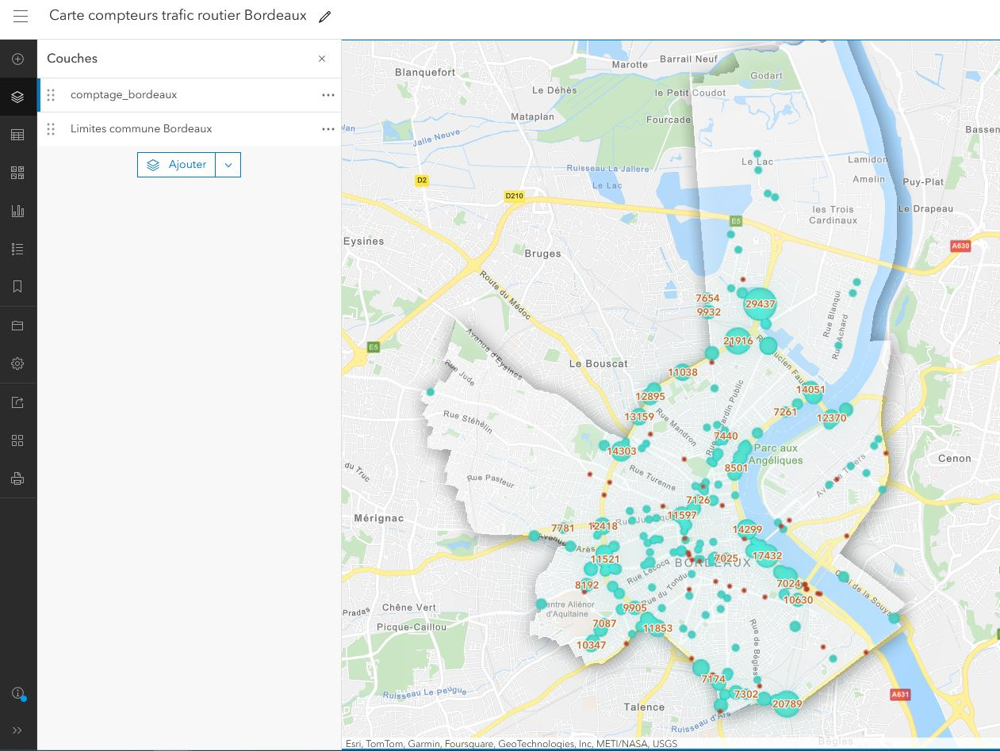 

Enfin, j'ai inséré cette carte dans un Dashboard, au sein duquel j'affiche plusieurs indicateurs issus des données : 
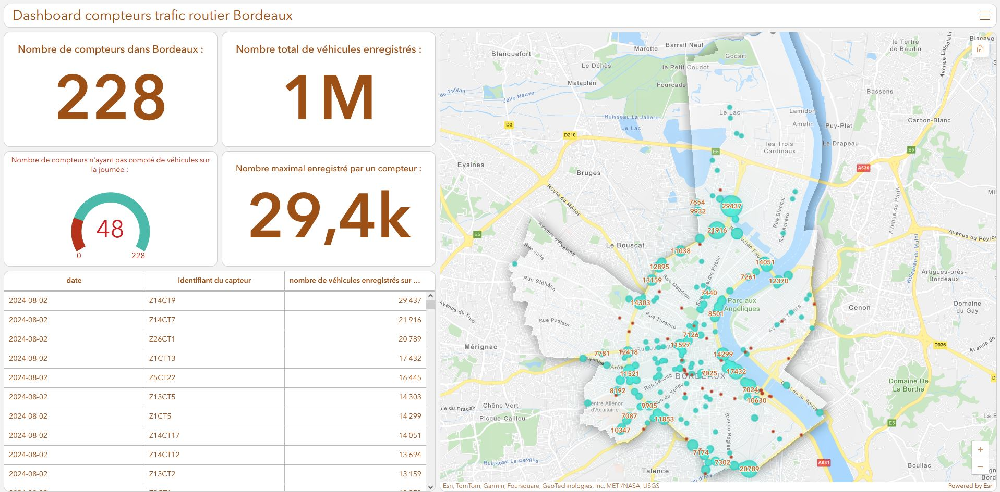  

#### Accès au feature layer

Afin de mettre à jour le feature layer, nous allons commencer par y accéder. Pour cela, nous utilisons la méthode [`search()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.search) du [`ContentManager`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#contentmanager). Si jamais vous aviez modifié le nom du feature layer au moment de la publication dans le tutoriel précédent, changez également le titre dans l'argument de la recherche dans la cellule ci-dessous. Pour rendre la recherche plus précise, nous spécifions également que nous cherchons un élément de type Feature Layer.
Pour rappel, `search()` renvoit une liste. Pour accéder à notre feature layer, nous accédons au premier élément de cette liste. 

<Item title:"comptage_bordeaux" type:Feature Layer Collection owner:plouis_esrifrance>
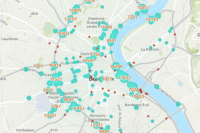

In [7]:
fl_comptage = gis.content.search("title : comptage_bordeaux","Feature Layer")[0]
fl_comptage

#### Création d'un backup des données du Feature Layer

Lors de la mise à jour du Feature Layer, nous allons totalement supprimer les données actuellement contenues dans le feature layer. Ce n'est pas obligatoire, mais nous allons d'abord utiliser une fonction de clonage afin de conserver un historique des anciennes données. Attention cependant, si vous exécutez ce type de script de manière quotidienne en conservant systématiquement l'historique, votre espace de stockage pourrait se remplir relativement vite.  
Pour nommer le clone, nous allons récupérer la date des données présentes actuellement dans le feature layer. Pour info, la date est contenue dans le champ 'date' de celui-ci. Si je veux être sûre de la syntaxe du nom du champ, je peux pour rappel accéder à la liste des champs de la couche en accédant à la propriété `name` des `properties` de la couche de mon feature layer :

In [3]:
for f in fl_comptage.layers[0].properties.fields:
    print(f['name'])

FID
date
identifian
zone
comptage_5
lat_long
latitude
longitude


Afin d'accéder facilement aux données contenues dans ma couche, nous allons lire celle-ci en tant que spatially enabled dataframe (sedf) avec la fonction [`from_layer`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.GeoAccessor.from_layer) du [`GeoAccessor`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#geoaccessor) :

In [4]:
sdf = pd.DataFrame.spatial.from_layer(fl_comptage.layers[0])
sdf

,FID,date,identifian,zone,comptage_5,lat_long,latitude,longitude,SHAPE
0,1141,2024-08-02,Z14CT9,14,29437.0,"44.8739855, -0.5651702",44.873986,-0.56517,"{""x"": -62914.45887553258, ""y"": 5601704.8503155..."
1,1142,2024-08-02,Z14CT7,14,21916.0,"44.8683337, -0.5699995",44.868334,-0.569999,"{""x"": -63452.05409242054, ""y"": 5600817.0841402..."
2,1143,2024-08-02,Z26CT1,26,20789.0,"44.812543, -0.5593751",44.812543,-0.559375,"{""x"": -62269.351294436485, ""y"": 5592058.337254..."
3,1144,2024-08-02,Z1CT13,1,17432.0,"44.835321, -0.5637112",44.835321,-0.563711,"{""x"": -62752.04373846519, ""y"": 5595633.2984031..."
4,1145,2024-08-02,Z5CT22,5,16445.0,"44.8319901, -0.5592043",44.83199,-0.559204,"{""x"": -62250.337925408996, ""y"": 5595110.432179..."
...,...,...,...,...,...,...,...,...,...
223,1364,2024-08-02,Z3CT1,3,0.0,"44.8301427, -0.5805599",44.830143,-0.58056,"{""x"": -64627.63244299383, ""y"": 5594820.4505926..."
224,1365,2024-08-02,Z12CT16,12,0.0,"44.8152851, -0.5653311",44.815285,-0.565331,"{""x"": -62932.37018160121, ""y"": 5592488.6295416..."
225,1366,2024-08-02,Z12CT5,12,0.0,"44.8114133, -0.5738273",44.811413,-0.573827,"{""x"": -63878.16283927903, ""y"": 5591881.0698751..."
226,1367,2024-08-02,Z3CT16,3,0.0,"44.8289612, -0.5641726",44.828961,-0.564173,"{""x"": -62803.40655151722, ""y"": 5594634.9984749..."


Je peux ensuite récupérer la date en accédant à une des valeurs contenues dans la colonne 'date'. Puisque toutes les données contenues ont la même date (car nous avions filtré sur la date au moment de la préparation des données), je peux accéder à la valeur de n'importe quelle ligne. Ici, je prends donc simplement celle de la première ligne (à l'index 0).

In [5]:
fl_date = sdf['date'].values[0]
fl_date

'2024-08-02'

Nous pouvons maintenant créer un clone du feature layer avec la méthode [`clone_items()`](https://developers.arcgis.com/python/api-reference/arcgis.gis.toc.html#arcgis.gis.ContentManager.clone_items) comme nous l'avions fait au début du tutoriel pour la webmap.

In [8]:
clone_fl = gis.content.clone_items(items = [fl_comptage])
clone_fl

[<Item title:"comptage_bordeaux" type:Feature Layer Collection owner:plouis_esrifrance>]

A nouveau comme toute à l'heure avec la méthode [`update()`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#arcgis.mapping.WebMap.update), je mets à jour le titre de mon clone afin qu'il ne possède plus le même nom que mon feature layer d'origine, en y insérant la variable contenant la date des données. La méthode [`update()`](https://developers.arcgis.com/python/api-reference/arcgis.mapping.toc.html#arcgis.mapping.WebMap.update) renvoyant une liste, je dois accéder à l'élément de la liste contenant le clone du feature layer en en précisant l'index pour pouvoir modifier le titre.

In [9]:
clone_fl[0].update(item_properties={'title':f'comptage_bordeaux_backup_{fl_date}'})

True

Si nous le souhaitons, nous pouvons appeler le clone fraîchement créé pour le consulter :

<Item title:"comptage_bordeaux_backup_2024-08-02" type:Feature Layer Collection owner:plouis_esrifrance>
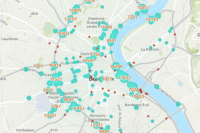

In [10]:
clone_fl[0]

#### Téléchargement et préparation des nouvelles données

Le script de cette partie correspond à ce que nous avions vu en terme de téléchargement et préparation de données dans le [tutoriel 5](https://www.codethemap.fr/2024/07/api-python-arcgis-contenu-preparation-donnees-sedf.html). Je ne le redécrirait pas ici, je vous invite donc à aller consulter le tutoriel précédent si vous voulez plus d'informations sur cette partie.

In [11]:
import datetime
import requests
import os
import pandas as pd

In [12]:
date_av_hier = (datetime.datetime.now() - datetime.timedelta(days=2)).strftime("%Y-%m-%d")
date_av_hier

'2024-08-03'

In [13]:
def creation_dossier(nom_dossier: str) -> None:
    home_path = os.path.abspath('/arcgis/home')
    chemin_dossier = os.path.join(home_path, nom_dossier)
    if not os.path.exists(chemin_dossier):
        os.makedirs(chemin_dossier)
        print(f"Dossier créé: {chemin_dossier}")
    else:
        print(f"Le dossier {nom_dossier} existe déjà dans {chemin_dossier}.")
    return(chemin_dossier)

#création du dossier 
chemin_dossier = creation_dossier(f'donnees_comptage_bordeaux_{date_av_hier}')

Dossier créé: /arcgis/home/donnees_comptage_bordeaux_2024-08-03


In [14]:
def telechargement_donnees(dossier_cible):
    
    nom_donnee = "donnees_comptage_bordeaux.csv"
    url = "https://www.data.gouv.fr/fr/datasets/r/a36dd980-94f6-423f-8bb5-6d92404d3e4e"
        
    print(f"Téléchargement du fichier {nom_donnee} depuis {url}...")
        
    req = requests.get(url, allow_redirects=True)
    url_content = req.content
    csv_file = open(f'{dossier_cible}//{nom_donnee}', 'wb')
    csv_file.write(url_content)
    csv_file.close()
    print(f"Le fichier {nom_donnee} a été téléchargé")

#téléchargement du fichier en utilisant la fonction créée
telechargement_donnees(chemin_dossier)

Téléchargement du fichier donnees_comptage_bordeaux.csv depuis https://www.data.gouv.fr/fr/datasets/r/a36dd980-94f6-423f-8bb5-6d92404d3e4e...
Le fichier donnees_comptage_bordeaux.csv a été téléchargé


In [15]:
df_trafic_bordeaux = pd.read_csv(os.path.join(chemin_dossier, "donnees_comptage_bordeaux.csv"),sep = ";", low_memory = False) 
df_trafic_na = df_trafic_bordeaux.dropna()
df_trafic_colonnes = df_trafic_na.rename(columns={'time': 'date', 'ident': 'identifiant','geo_point_2d':'lat_long'})
df_trafic_drop_colonnes = df_trafic_colonnes.drop(['gid', 'type','cdate'], axis=1)
df_av_hier = df_trafic_drop_colonnes[df_trafic_drop_colonnes['date'] == date_av_hier]
df_trafic_final = df_av_hier.sort_values(by=['comptage_5m'],ascending=False)

df_trafic_final[['latitude', 'longitude']] = df_trafic_final['lat_long'].str.split(',', expand=True)
df_trafic_final['latitude'] = df_trafic_final['latitude'].astype(float)
df_trafic_final['longitude'] = df_trafic_final['longitude'].astype(float)
sedf_trafic = pd.DataFrame.spatial.from_xy(df=df_trafic_final, x_column='longitude', y_column='latitude', sr=4326)

In [16]:
recherche_bdx = gis.content.search("id:20faac07e4944217a43d84734360b84d",outside_org = True)
bdx = recherche_bdx[0]
sedf_bdx = pd.DataFrame.spatial.from_layer(bdx.layers[0])

In [17]:
geom_bdx = sedf_bdx.iloc[0].SHAPE
requete = sedf_trafic.SHAPE.geom.disjoint(geom_bdx) == False
sedf_trafic_bdx_only = sedf_trafic.loc[requete].copy()

sedf_trafic_bdx_only

,date,identifiant,zone,comptage_5m,lat_long,latitude,longitude,SHAPE
107839,2024-08-03,Z14CT7,14,29539.0,"44.8683337, -0.5699995",44.868334,-0.569999,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
106746,2024-08-03,Z26CT1,26,26048.0,"44.812543, -0.5593751",44.812543,-0.559375,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
88001,2024-08-03,Z14CT9,14,24049.0,"44.8739855, -0.5651702",44.873986,-0.565170,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
68386,2024-08-03,Z1CT13,1,15000.0,"44.835321, -0.5637112",44.835321,-0.563711,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
319,2024-08-03,Z5CT22,5,13842.0,"44.8319901, -0.5592043",44.831990,-0.559204,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
...,...,...,...,...,...,...,...,...
67174,2024-08-03,Z201CT14,2,0.0,"44.8357876, -0.5807869",44.835788,-0.580787,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
69499,2024-08-03,Z11CT14,11,0.0,"44.8195011, -0.5800581",44.819501,-0.580058,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
125157,2024-08-03,Z9CT19,9,0.0,"44.8297447, -0.6032539",44.829745,-0.603254,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.6..."
69883,2024-08-03,Z11CT13,11,0.0,"44.8170151, -0.5754863",44.817015,-0.575486,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."


#### Récupération de et suppression de tous les enregistrements du feature layer

Les nouvelles données ayant été récupérées, elles vont pouvoir être ajoutées au Feature Layer pour le mettre à jour. Mais dans un premier temps, nous devons supprimer les données étant actuellement contenues dedans car elles sont obsolètes. Notez que j'accède bien au feature layer d'origine *et non pas à son clone*, car celui-ci est fait pour contenir les données de backup et ne sera donc pas mis à jour.  

Afin de récupérer toutes les entités de ma couches, nous pouvons utiliser la fonction [`query()`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.FeatureLayer.query) sur celle-ci. Si la requête est vide, alors toutes les entités de la couche sont renvoyées.  
La deuxième ligne de la cellule permet d'afficher le résultat de la requête sous la forme d'un spatially enabled dataframe afin de vérifier les données renvoyées.

In [18]:
fset = fl_comptage.layers[0].query() #requêter sans aucune condition renvoie toutes les entités
fset.sdf

,FID,date,identifian,zone,comptage_5,lat_long,latitude,longitude,SHAPE
0,1141,2024-08-02,Z14CT9,14,29437.0,"44.8739855, -0.5651702",44.873986,-0.56517,"{""x"": -62914.45887553258, ""y"": 5601704.8503155..."
1,1142,2024-08-02,Z14CT7,14,21916.0,"44.8683337, -0.5699995",44.868334,-0.569999,"{""x"": -63452.05409242054, ""y"": 5600817.0841402..."
2,1143,2024-08-02,Z26CT1,26,20789.0,"44.812543, -0.5593751",44.812543,-0.559375,"{""x"": -62269.351294436485, ""y"": 5592058.337254..."
3,1144,2024-08-02,Z1CT13,1,17432.0,"44.835321, -0.5637112",44.835321,-0.563711,"{""x"": -62752.04373846519, ""y"": 5595633.2984031..."
4,1145,2024-08-02,Z5CT22,5,16445.0,"44.8319901, -0.5592043",44.83199,-0.559204,"{""x"": -62250.337925408996, ""y"": 5595110.432179..."
...,...,...,...,...,...,...,...,...,...
223,1364,2024-08-02,Z3CT1,3,0.0,"44.8301427, -0.5805599",44.830143,-0.58056,"{""x"": -64627.63244299383, ""y"": 5594820.4505926..."
224,1365,2024-08-02,Z12CT16,12,0.0,"44.8152851, -0.5653311",44.815285,-0.565331,"{""x"": -62932.37018160121, ""y"": 5592488.6295416..."
225,1366,2024-08-02,Z12CT5,12,0.0,"44.8114133, -0.5738273",44.811413,-0.573827,"{""x"": -63878.16283927903, ""y"": 5591881.0698751..."
226,1367,2024-08-02,Z3CT16,3,0.0,"44.8289612, -0.5641726",44.828961,-0.564173,"{""x"": -62803.40655151722, ""y"": 5594634.9984749..."


Nous pouvons ensuite appliquer la méthode [`delete_features`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.FeatureLayer.delete_features) sur notre couche en passant le résultat de la requête en argument pour le paramètre `deletes`.  
Cela va supprimer toutes les entités renvoyées par la requête. Dans notre cas, il s'agit de 100% des entités contenues actuellement dans la couche car nous avons laissé la requête vide, mais notez que vous pourriez tirer parti des requêtes pour mettre à jour vos couches en accédant uniquement à certaines entités de celles-ci.

In [19]:
fl_comptage.layers[0].delete_features(deletes=fset)

{'deleteResults': [{'objectId': 1141,
   'uniqueId': 1141,
   'globalId': None,
   'success': True},
  {'objectId': 1142, 'uniqueId': 1142, 'globalId': None, 'success': True},
  {'objectId': 1143, 'uniqueId': 1143, 'globalId': None, 'success': True},
  {'objectId': 1144, 'uniqueId': 1144, 'globalId': None, 'success': True},
  {'objectId': 1145, 'uniqueId': 1145, 'globalId': None, 'success': True},
  {'objectId': 1146, 'uniqueId': 1146, 'globalId': None, 'success': True},
  {'objectId': 1147, 'uniqueId': 1147, 'globalId': None, 'success': True},
  {'objectId': 1148, 'uniqueId': 1148, 'globalId': None, 'success': True},
  {'objectId': 1149, 'uniqueId': 1149, 'globalId': None, 'success': True},
  {'objectId': 1150, 'uniqueId': 1150, 'globalId': None, 'success': True},
  {'objectId': 1151, 'uniqueId': 1151, 'globalId': None, 'success': True},
  {'objectId': 1152, 'uniqueId': 1152, 'globalId': None, 'success': True},
  {'objectId': 1153, 'uniqueId': 1153, 'globalId': None, 'success': True},

#### Comparaison des structures des deux sets de données

Maintenant que nous avons supprimé les anciennes données du feature layer, nous sommes à priori prêts à y écrire les données nouvellement récupérées. Nous allons cependant vérifier que le feature layer à mettre à jour et le spatially enabled dataframe contenant les données à écrire ont bien le même format, notamment au niveau du nom des colonnes. J'utilise des foncitons des dataframes afin de comparer les différences de nom de colonnes entre mes deux sets de données :

In [20]:
columns_df1 = set(fset.sdf.columns)
columns_df2 = set(sedf_trafic_bdx_only.columns)
diff_df1_to_df2 = columns_df1.symmetric_difference(columns_df2)
diff_df1_to_df2

{'FID', 'comptage_5', 'comptage_5m', 'identifian', 'identifiant'}

Je constate que mon feature layer publié a les noms de colonne 'comptage_5' et 'identifian' là où celles de mon sedf contenant les nouvelles données s'appellent 'comptage_5m' et 'identifiant'. Les noms des colonnes ont été tronquées lors de la publication. Elles auraient également pu être modifiées après publication par exemple. Cela empêchera les données de s'écrire correctement à l'intérieur de ces colonnes, alors pensez à vérifier cela si vous constatez que certaines colonnes ne s'écrivent plus lors des mises à jour.  
Afin d'éviter les problèmes d'écriture, nous allons renomer les colonnes du sedf exactement de la même manière que celles du feature layer :

In [21]:
sedf_final = sedf_trafic_bdx_only.rename(columns={'comptage_5m': 'comptage_5', 'identifiant': 'identifian'})
sedf_final

,date,identifian,zone,comptage_5,lat_long,latitude,longitude,SHAPE
107839,2024-08-03,Z14CT7,14,29539.0,"44.8683337, -0.5699995",44.868334,-0.569999,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
106746,2024-08-03,Z26CT1,26,26048.0,"44.812543, -0.5593751",44.812543,-0.559375,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
88001,2024-08-03,Z14CT9,14,24049.0,"44.8739855, -0.5651702",44.873986,-0.565170,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
68386,2024-08-03,Z1CT13,1,15000.0,"44.835321, -0.5637112",44.835321,-0.563711,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
319,2024-08-03,Z5CT22,5,13842.0,"44.8319901, -0.5592043",44.831990,-0.559204,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
...,...,...,...,...,...,...,...,...
67174,2024-08-03,Z201CT14,2,0.0,"44.8357876, -0.5807869",44.835788,-0.580787,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
69499,2024-08-03,Z11CT14,11,0.0,"44.8195011, -0.5800581",44.819501,-0.580058,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
125157,2024-08-03,Z9CT19,9,0.0,"44.8297447, -0.6032539",44.829745,-0.603254,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.6..."
69883,2024-08-03,Z11CT13,11,0.0,"44.8170151, -0.5754863",44.817015,-0.575486,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."


Si vous rencontrez d'autres problèmes d'écriture, pensez également à comparer les types de données attendues dans chacunes des colonnes avec la propriété la propriété [`dtypes`](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dtypes.html) de vos dataframes :

In [22]:
sedf_final.dtypes

date            object
identifian      object
zone             int32
comptage_5     float64
lat_long        object
latitude       float64
longitude      float64
SHAPE         geometry
dtype: object

In [24]:
fset.sdf.dtypes

FID                    Int64
date          string[python]
identifian    string[python]
zone                   Int32
comptage_5           Float64
lat_long      string[python]
latitude             Float64
longitude            Float64
SHAPE               geometry
dtype: object

Ici, normalement, les types de données correspondent (en notant que le type de données `object` correspond bien à un string, spécifique aux dataframes). Si ça n'est pas le cas, vous pouvez facilement convertir les types de données des colonnes du dataframe contenant les nouvelles données grâce à la méthode [`astype()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.astype.html)

#### Insertion des nouvelles données dans le Feature Layer

Afin de pouvoir insérer les données du sedf dans le feature layer, nous devons commencer par convertir les sedf en [`Feature Set`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.FeatureSet) avec la méthode [`to_featureset()`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.GeoAccessor.to_featureset) du [`GeoAccessor`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#geoaccessor) :

In [25]:
features = sedf_final.spatial.to_featureset()
features.sdf

,date,identifian,zone,comptage_5,lat_long,latitude,longitude,OBJECTID,SHAPE
0,2024-08-03,Z14CT7,14,29539.0,"44.8683337, -0.5699995",44.868334,-0.569999,1,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
1,2024-08-03,Z26CT1,26,26048.0,"44.812543, -0.5593751",44.812543,-0.559375,2,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
2,2024-08-03,Z14CT9,14,24049.0,"44.8739855, -0.5651702",44.873986,-0.56517,3,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
3,2024-08-03,Z1CT13,1,15000.0,"44.835321, -0.5637112",44.835321,-0.563711,4,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
4,2024-08-03,Z5CT22,5,13842.0,"44.8319901, -0.5592043",44.83199,-0.559204,5,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
...,...,...,...,...,...,...,...,...,...
223,2024-08-03,Z201CT14,2,0.0,"44.8357876, -0.5807869",44.835788,-0.580787,224,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
224,2024-08-03,Z11CT14,11,0.0,"44.8195011, -0.5800581",44.819501,-0.580058,225,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."
225,2024-08-03,Z9CT19,9,0.0,"44.8297447, -0.6032539",44.829745,-0.603254,226,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.6..."
226,2024-08-03,Z11CT13,11,0.0,"44.8170151, -0.5754863",44.817015,-0.575486,227,"{""spatialReference"": {""wkid"": 4326}, ""x"": -0.5..."


Afin d'insérer les données dans la couche, nous utilisons la méthode [`edit_features()`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.FeatureLayer.edit_features) du [`FeatureLayer`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#featurelayer). Nous précisons en argument de la fonction que le [`Feature Set`](https://developers.arcgis.com/python/api-reference/arcgis.features.toc.html#arcgis.features.FeatureSet) à ajouter aux données est celui créé juste au-dessus.

In [26]:
fl_comptage.layers[0].edit_features(adds=features)

{'addResults': [{'objectId': 1369,
   'uniqueId': 1369,
   'globalId': None,
   'success': True},
  {'objectId': 1370, 'uniqueId': 1370, 'globalId': None, 'success': True},
  {'objectId': 1371, 'uniqueId': 1371, 'globalId': None, 'success': True},
  {'objectId': 1372, 'uniqueId': 1372, 'globalId': None, 'success': True},
  {'objectId': 1373, 'uniqueId': 1373, 'globalId': None, 'success': True},
  {'objectId': 1374, 'uniqueId': 1374, 'globalId': None, 'success': True},
  {'objectId': 1375, 'uniqueId': 1375, 'globalId': None, 'success': True},
  {'objectId': 1376, 'uniqueId': 1376, 'globalId': None, 'success': True},
  {'objectId': 1377, 'uniqueId': 1377, 'globalId': None, 'success': True},
  {'objectId': 1378, 'uniqueId': 1378, 'globalId': None, 'success': True},
  {'objectId': 1379, 'uniqueId': 1379, 'globalId': None, 'success': True},
  {'objectId': 1380, 'uniqueId': 1380, 'globalId': None, 'success': True},
  {'objectId': 1381, 'uniqueId': 1381, 'globalId': None, 'success': True},
  

Nous pouvons maintenant appeler notre Feature Layer, et aller le consulter pour voir les données mises à jour :

<Item title:"comptage_bordeaux" type:Feature Layer Collection owner:plouis_esrifrance>
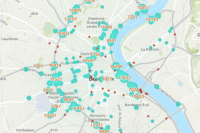

In [27]:
fl_comptage

Comme je vous le disais, ce workflow met à jour non seulement le feature layer, mais se répercutent également sur toutes les cartes et les applications appelant ce dernier. Par exemple, vous pouvez voir ci-dessous le Dashboard que j'ai créé avec les anciennes données (à gauche), puis après exécution du script ci-dessus et mise à jour des données (à droite) :  
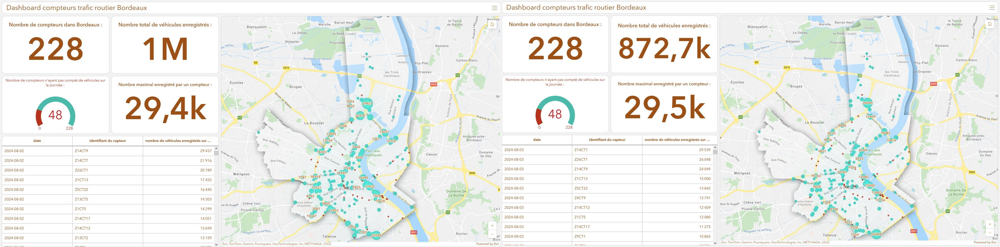
Notez que toutes les étiquettes de la carte se sont actualisés automatiquement, et qu'il en va de même pour les indicateurs du Dashboard.

### 4/ Planifier l'exécution de la mise à jour

Ce genre de script de mise à jour gagne beaucoup de valeur s'il s'exécute automatiquement. Si vous utilisez ArcGIS Notebooks, sachez qu'il est possible de créer une tâche pour planifier l'exécution de ce script de manière très facile. Cela vous permet par exemple de mettre à jour les données et d'obtenir un Dashboard actualisé quotidiennement, sans avoir à aller exécuter le Notebook par vous-même. 

Pour cela, créez une version épurée du Notebook contenant uniquement l'import des bibliothèque et la connexion au SIG, puis les codes du chapitre 3 du tutoriel (vous pouvez également supprimer tous les affichages dynamiques afin d'alléger encore d'avantage le Notebook et accélérer son temps d'exécution).  
Enregistrez-le dans vos contenus. Vous pourrez ensuite accéder à l'onglet Tâches dans le bandeau supérieur, et créer une Tâche où vous pourrez paramétrer la fréquence d'exécution du Notebook comme illustré dans la vidéo ci-dessous :  
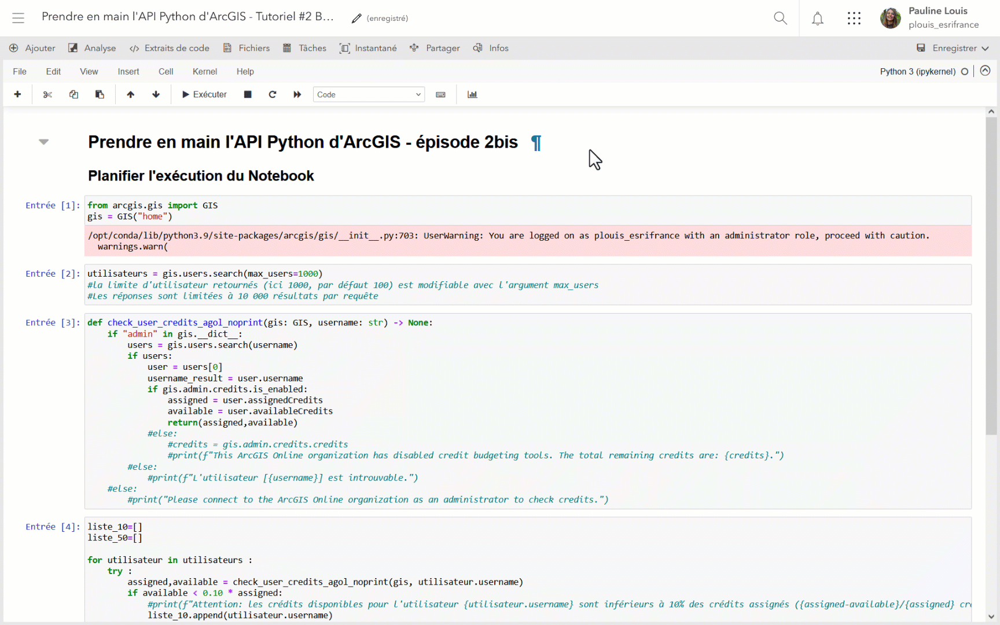

Les paramètres utilisés dans la vidéo ont été utilisés lors d'un [tutoriel précédent](https://www.codethemap.fr/2024/07/admin-credits-tache-notebook-api-python-arcgis.html). Ici, vous pouvez adapter des paramètres comme le titre et la fréquence d'exécution.  
Notez que l'exécution planifiée de tâches de Notebooks dans ArcGIS Online consomme des crédits de votre organisation. Le nombre de crédits dépend du runtime utilisé par votre Notebook. Ici, avec un runtime standard, l'exécution consomme 1,5 crédits par heure avec un calcul à la minute. Ce type de Notebook de seulement quelques cellules ne prend que quelques minutes à s'exécuter, sa planification ne devrait donc pas avoir de gros impacts sur votre consommation de crédits. Vous pouvez en apprendre plus sur la consommation de crédits selon le runtime du Notebook sur [cette page de l'aide en ligne](https://doc.arcgis.com/fr/arcgis-online/administer/credits.htm).